**Music Recommendation System using Spotify Dataset**

Source: https://www.kaggle.com/datasets/vatsalmavani/spotify-dataset

pada notebook ini, penulis menggunakan atau mengambil dataset dari Spotify. Tujuan dari notebook ini yaitu membuat sistem rekomendasi lagu. Untuk melakukan ini, penulis mempresentasikan beberapa proses visualisasi untuk memahami data dan melakukan beberapa EDA (Exploratory Data Analysis) serta melakukan clustering k-means. dengan demikian penulis dapat memilih fitur yang relevan untuk membuat Sistem Rekomendasi.

terdapat 7 step yang dilakukan dalam notebook ini, yaitu;
  1. Import Libraries
  2. Read Data
  3. Data Understanding by Visualization and EDA
  4. Characteristics of Different Genres
  5. Clustering Songs with K-Means
  6. Clustering Songs with K-Means
  7. Build Recommender System



## **Import Libraries**

In [ ]:
# import libraries
import os
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

# libraries untuk melakukan clustering
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

## **Read Data**

mengimport ke 3 dataset, yaitu data, data by genres, data by year.

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving data.csv to data.csv


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving data_by_genres.csv to data_by_genres.csv


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving data_by_year.csv to data_by_year.csv


In [ ]:
# membaca dataset
data = pd.read_csv("data.csv")
genre_data = pd.read_csv('data_by_genres.csv')
year_data = pd.read_csv('data_by_year.csv')

In [ ]:
# info mengenai kolom dari dataset data
# dari info dataset pada data dibawah terdapat 3 data type yaitu float(9), int(6), dan object (4)
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
# info mengenai kolom dari dataset genre data
#dari info dataset pada data diatas terdapat 3 data type yaitu float(11), int(2), dan object (1)
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [ ]:
# info mengenai kolom dari dataset year data
#dari info dataset pada  year data diatas terdapat 2 data type yaitu float(11), int(3)
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


pada tahap ini kita akan memeriksa semua analisis dengan target sebagai 'popularitas'. Sebelum melakukan  kita akan periksa Korelasi Fitur dengan mempertimbangkan beberapa fitur dan untuk itu, disini penulis menggunakan yellowbrick untuk memvisualisasikan data teks.

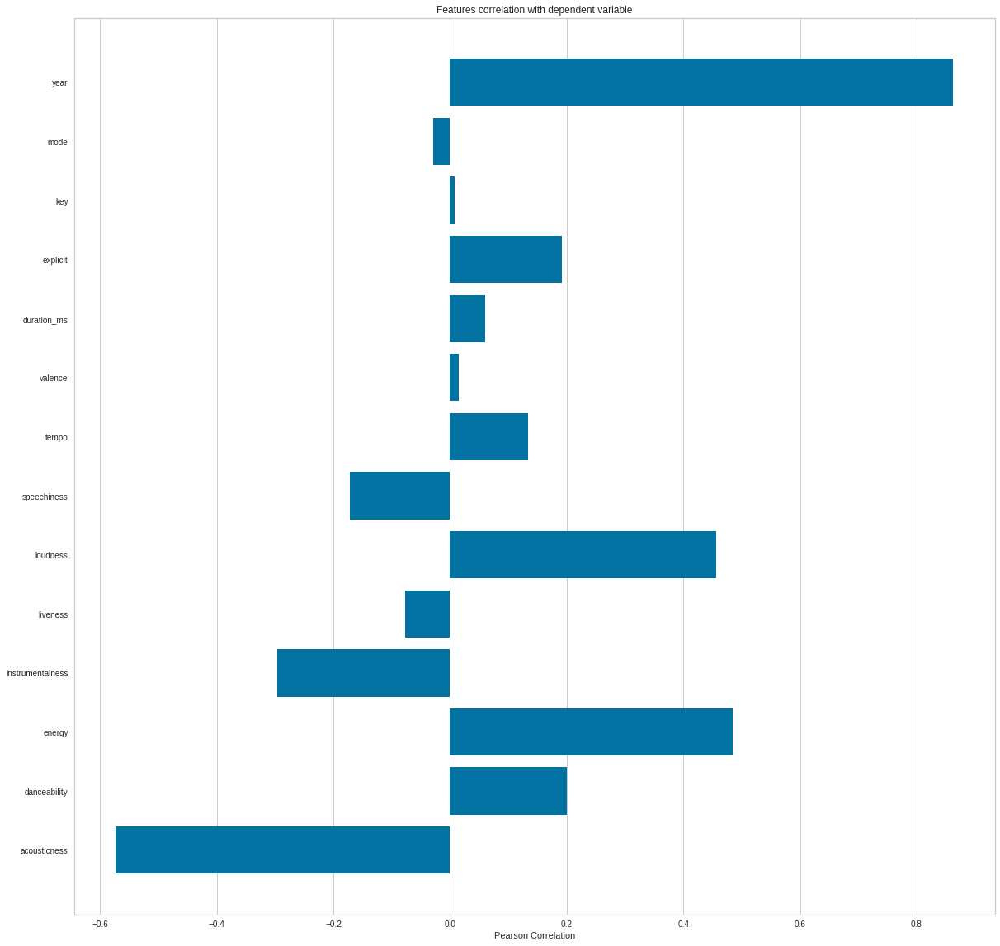

In [ ]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Membuat daftar nama fitur
features = np.array(feature_names)

# menginstal visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
# Menyesuaikan data dengan  menggunakan visualizer
visualizer.fit(X, y)     
visualizer.show()

## **Data Understanding by Visualization and EDA**

### **Music Over Time**

pada tahap ini penulis menggunakan data yang dikelompokkan berdasarkan tahun, kita dapat memahami bagaimana keseluruhan suara musik telah berubah dari tahun 1921 hingga 2020. disini penulis menggunakan get_decade.

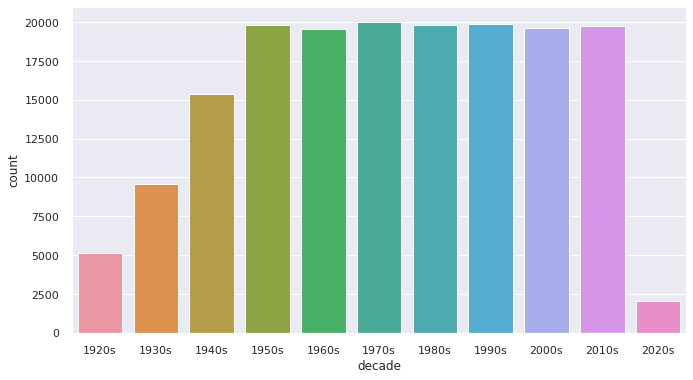

In [ ]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(data['decade'])

In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

## **Characteristics of Different Genres**

himpunan data ini berisi fitur audio untuk lagu yang berbeda bersama dengan fitur audio untuk genre yang berbeda. Kita dapat menggunakan informasi ini untuk membandingkan genre yang berbeda dan memahami perbedaan unik mereka dalam suara.

In [ ]:
#menampilkan 10 top genre
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

## **Clustering Genres with K-Means**

Di sini,  penulis menggunakan algoritma pengelompokan K-means   untuk membagi genre dalam dataset ini menjadi sepuluh cluster berdasarkan fitur audio numerik dari setiap genre.

In [ ]:
# merupakan libraries yang digunakan untuk melakukan clustering 
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10,))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

selanjutnya, memvisualisasikan cluster pada genres dengan t-SNE. t-SNE merupakan alat untuk memvisualisasikan data dimensi tinggi. disini t-SNE digunakan untuk memvisualisasikan genres dengan menggunakan grafik untuk menyederhanakan data besar dan berdimensi tinggi pada genres.

In [ ]:
# Memvisualisasikan Cluster pada genres dengan t-SNE

from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.007s...
[t-SNE] Computed neighbors for 2973 samples in 0.296s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.114594
[t-SNE] KL divergence after 1000 iterations: 1.394453


## **Clustering Songs with K-Means**

In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

pada tahap ini, selanjutnya memvisualisasikan cluster dengan menggunakan PCA. PCA sendiri merupakan teknik statistik tanpa pengawasan yang digunakan untuk memeriksa keterkaitan di antara serangkaian variabel untuk mengidentifikasi struktur yang mendasari variabel tersebut.

In [ ]:
# Memvisualisasikan Cluster dengan PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']


fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

## **Build Recommender System**

In [ ]:
!pip install spotipy

     |████████████████████████████████| 63 kB 1.7 MB/s 
     |████████████████████████████████| 138 kB 68.3 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict


sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials)

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):
    
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data
    
    except IndexError:
        return find_song(song['name'], song['year'])
        

def get_mean_vector(song_list, spotify_data):
    
    song_vectors = []
    
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  
    
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):
    
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
            
    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):
    
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    
    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])
    
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
recommend_songs([{'name': 'Come As You Are', 'year':1991}, {'name': 'Smells Like Teen Spirit', 'year': 1991},{'name': 'Lithium', 'year': 1992}],  data)

[{'artists': "['Alice In Chains']", 'name': 'No Excuses', 'year': 1994},
 {'artists': "['Alejandra Guzman']", 'name': 'Mirala Miralo', 'year': 1993},
 {'artists': "['ZZ Top']",
  'name': 'Sharp Dressed Man - 2008 Remaster',
  'year': 1983},
 {'artists': "['Bon Jovi']", 'name': 'Have A Nice Day', 'year': 2005},
 {'artists': "['One Direction']",
  'name': 'Where Do Broken Hearts Go',
  'year': 2014},
 {'artists': "['Nickelback']", 'name': 'Never Gonna Be Alone', 'year': 2008},
 {'artists': "['Deep Blue Something']",
  'name': "Breakfast At Tiffany's",
  'year': 1995},
 {'artists': "['ZZ Top']", 'name': "Gimme All Your Lovin'", 'year': 1983},
 {'artists': "['Santana', 'Michelle Branch']",
  'name': 'The Game of Love (feat. Michelle Branch) - Main / Radio Mix',
  'year': 2002},
 {'artists': "['Jo Dee Messina']",
  'name': 'Heads Carolina, Tails California',
  'year': 1996}]

yang saya dapat atau pelajari mengenai Algoritma k-means Clustering  diatas adalah k-means sendiri merupakan salah satu algoritma unsupervised learning,yang dimana tujuannya adalah untuk memisahkan kelompok dengan sifat yang sama dan menugaskan mereka ke dalam kelompok atau dengan kata lain mengelompokan data.